In [1]:
import os
import numpy as np
import pandas as pd
import copy
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

from sklearn.model_selection import train_test_split

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [3]:
normal_path = '../data/conf/normal/'
down_path = '../data/conf/false/'
abnormal_path = '../data/conf/abnormal'

In [30]:
# 길이 조정 함수
def length_scaling(data, target_length=1024):
    current_length = data.shape[0]
    scaling_factor = target_length / current_length
    scaled_data = np.zeros((target_length, data.shape[1]))


    for i in range(data.shape[1]):
        scaled_data[:, i] = np.interp(
            np.linspace(0, 1, target_length),
            np.linspace(0, 1, current_length),
            data[:, i]
        )

    return scaled_data


def df_rename(df):
    CM_list = ['CM7', 'CM8', 'CM9']
    
    for CM in CM_list:
        # 컬럼명 변경
        new_columns = {
            'CPC_LineB.CPC_PLCB.Global.' + CM + '_DATA_x.COM_PV_FP': 'FP',
            'CPC_LineB.CPC_PLCB.Global.' + CM + '_DATA_x.COM_PV_CP': 'CP',
            'CPC_LineB.CPC_PLCB.Global.' + CM + '_DATA_x.COM_PV_FT': 'Temperature',
            'CPC_LineB.CPC_PLCB.Global.' + CM + '_DATA_x.CAST_OUT_ACTION_TO_PQ_VAL': 'Cast'}
        df = df.rename(columns=new_columns)
    
    return df

def df_normalize(df):
    normalized_df = (df - df.min()) / (df.max() - df.min())
    return normalized_df

In [31]:
def make_df(path):
    cols = ['FP', 'CP', 'Temperature', 'Cast']
    df = []
    
    # 경로 내의 파일 및 폴더 확인
    for root, dirs, files in os.walk(path):
        # 확장자 .csv인 파일 선택
        csv_files = [file for file in files if file.endswith(".csv")]
        
        # csv 파일 처리
        for file in csv_files:
            file_path = os.path.join(root, file)
            
            # CSV 파일 읽고 추가
            csv_data = pd.read_csv(file_path)
            csv_data = df_rename(csv_data)
            csv_data = csv_data[cols].interpolate(method='linear') # 선형 보간
            csv_data = csv_data.dropna(axis=0).reset_index(drop=True)
            csv_data = df_normalize(csv_data)


            df.append(csv_data)
    
    # Pandas DataFrame => NumPy
    df_array = np.array([length_scaling(dataframe.values, 512) for dataframe in df])
        
    return df, df_array


temp, normal_df = make_df(normal_path)
#abnormal_df = make_df(abnormal_path)    

In [32]:
print(normal_df[0].shape)
print(normal_df.shape)
print(abnormal_df.shape)

(512, 4)
(7362, 512, 4)
(50, 256, 4)


In [33]:
temp

[            FP        CP  Temperature      Cast
 0     0.015175  0.023283     0.989512  0.469564
 1     0.097876  0.149010     0.989649  0.482609
 2     0.261760  0.399302     0.989785  0.495653
 3     0.423369  0.647264     0.989921  0.508698
 4     0.595979  0.912689     0.990057  0.521742
 ...        ...       ...          ...       ...
 4750  0.000759  0.001164     0.993871  0.521742
 4751  0.000759  0.001164     0.993871  0.521742
 4752  0.000759  0.001164     0.993871  0.521742
 4753  0.000759  0.001164     0.993871  0.521742
 4754  0.000759  0.001164     0.993871  0.521742
 
 [4755 rows x 4 columns],
             FP        CP  Temperature      Cast
 0     0.013097  0.018244     0.996151  0.469564
 1     0.064715  0.091220     0.996219  0.480000
 2     0.253467  0.366021     0.996354  0.490436
 3     0.428351  0.624857     0.996421  0.500871
 4     0.617103  0.909920     0.996489  0.511307
 ...        ...       ...          ...       ...
 4448  0.000770  0.001140     0.997029  0

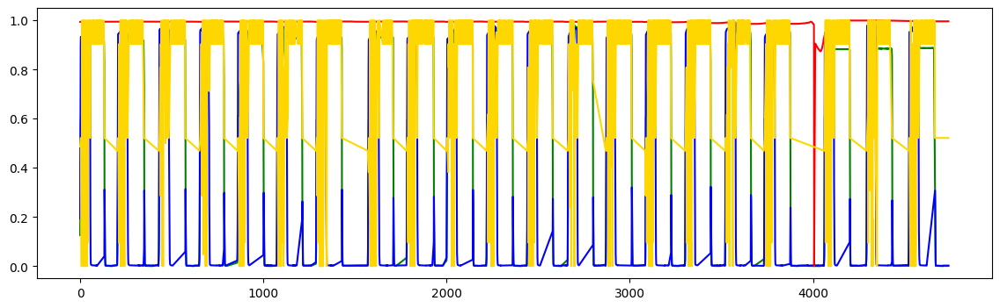

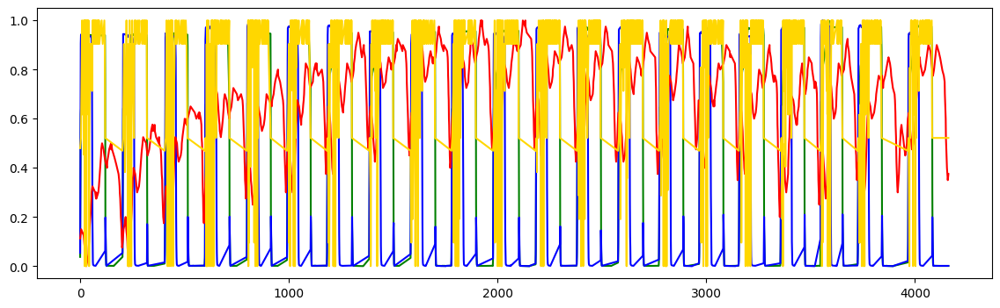

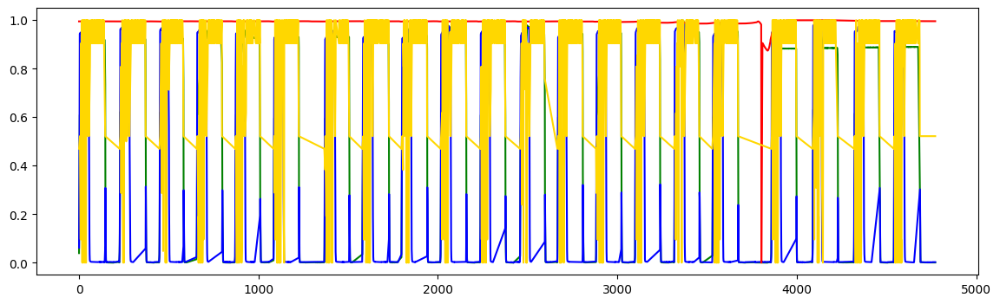

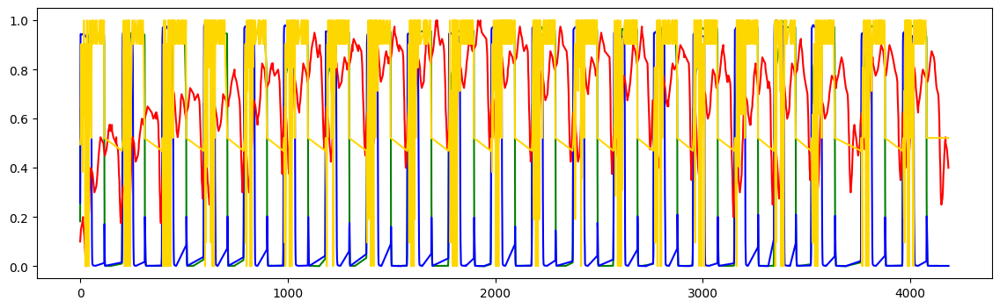

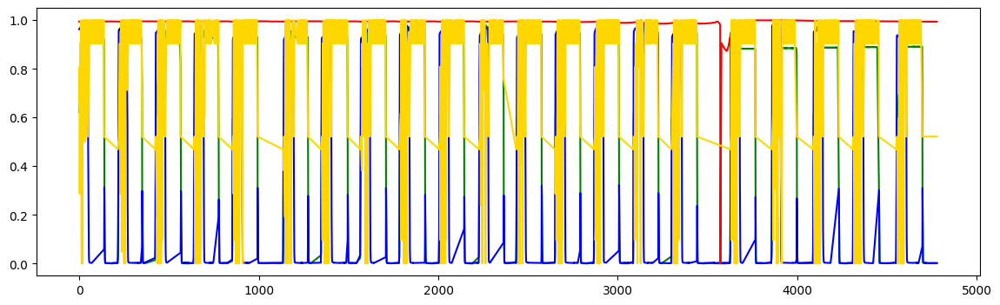

...

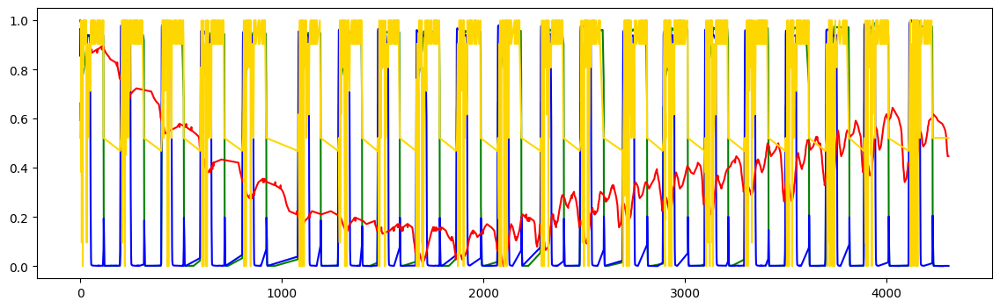

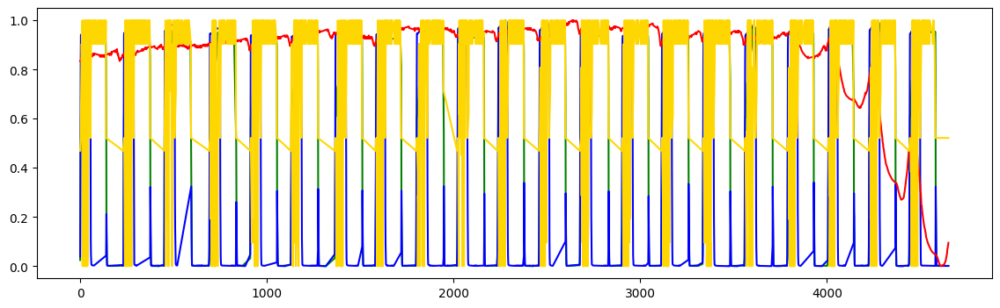

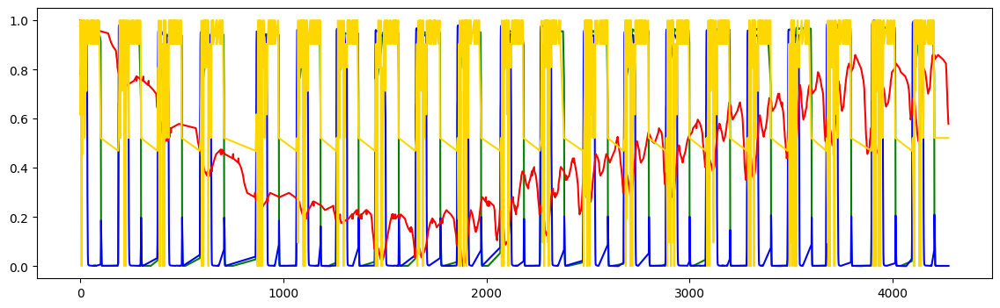

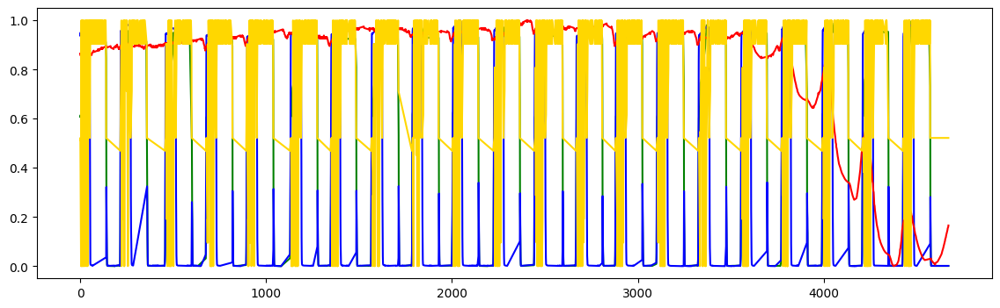

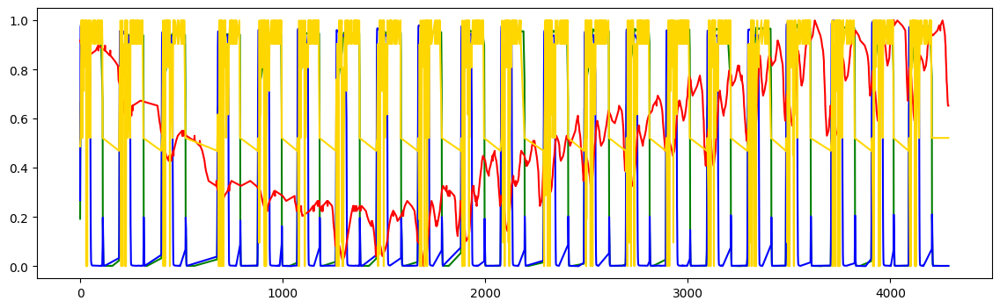

In [37]:

for i in range(35,100):
    t = temp[i]
    plt.figure(figsize=(14,4))
    plt.plot(t['FP'], color = 'green')
    plt.plot(t['CP'], color = 'blue')
    plt.plot(t['Temperature'], color = 'red')
    plt.plot(t['Cast'], color='gold')
    plt.show()
    

In [35]:
normal_df.shape

(7362, 512, 4)

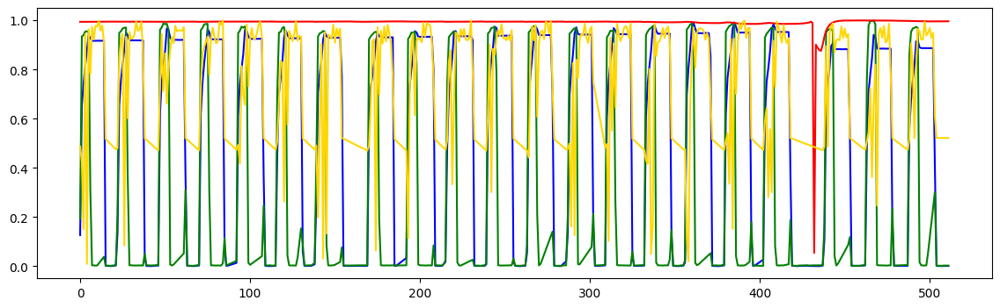

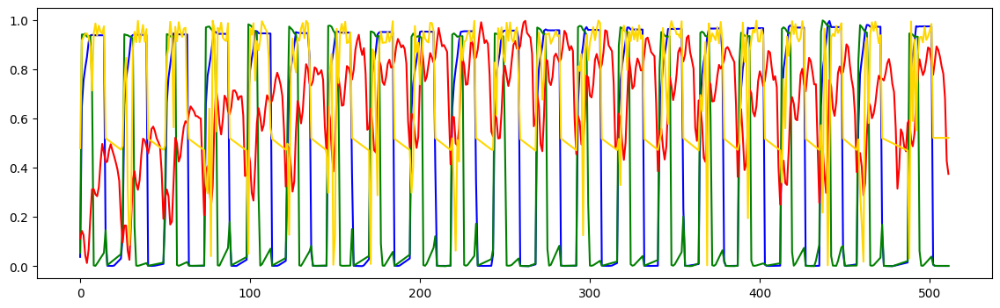

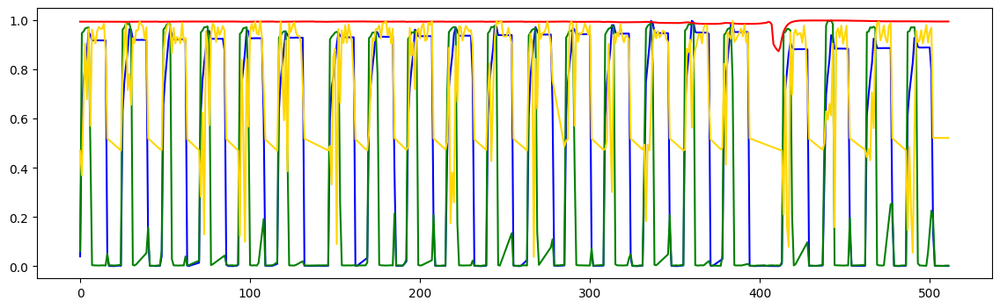

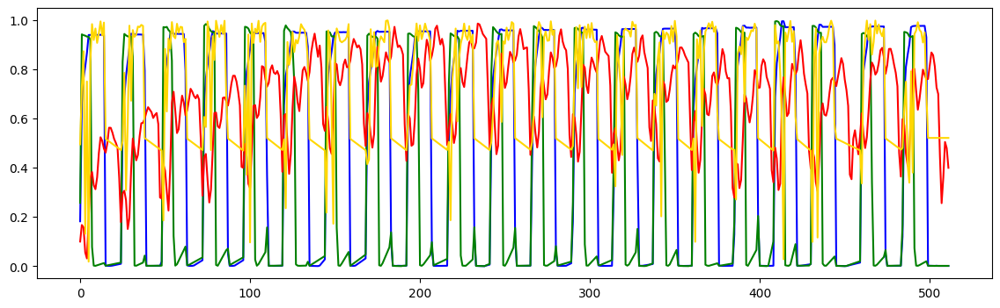

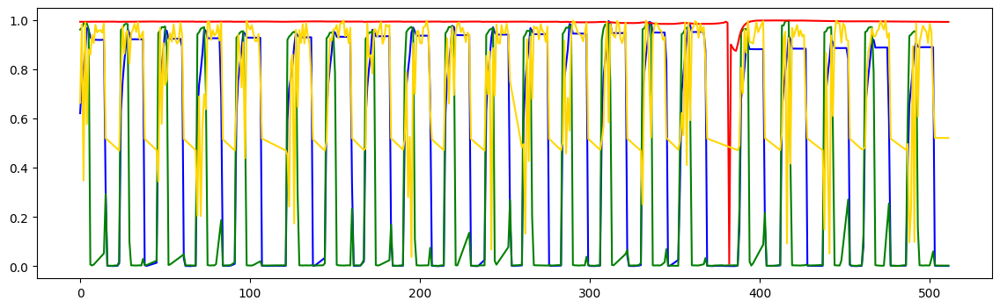

...

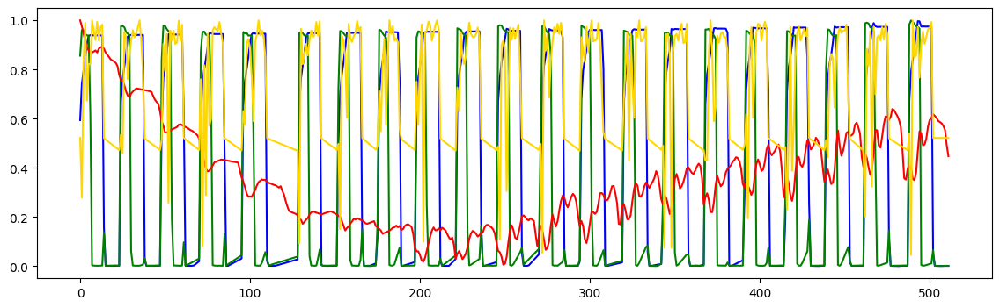

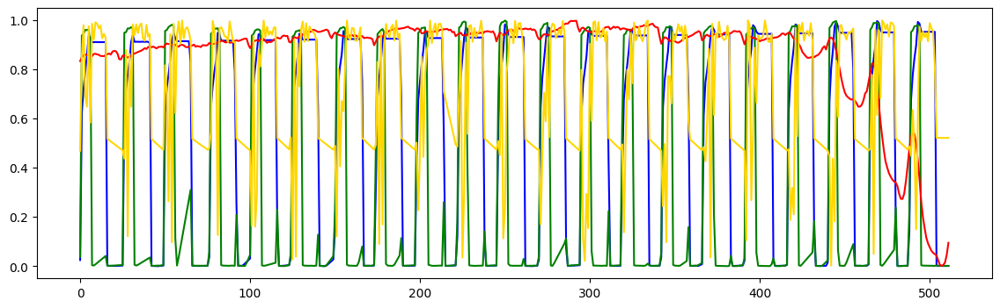

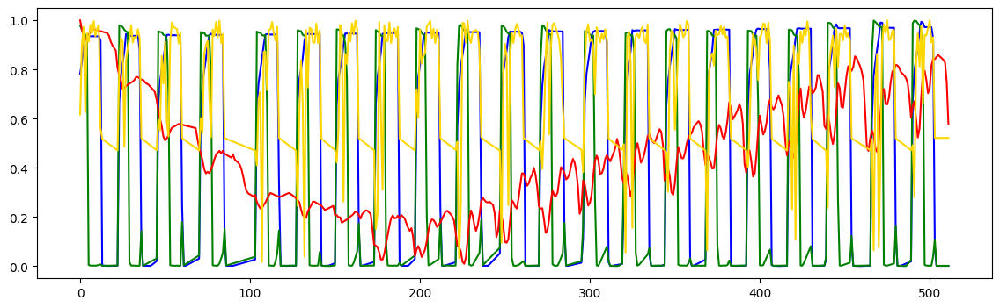

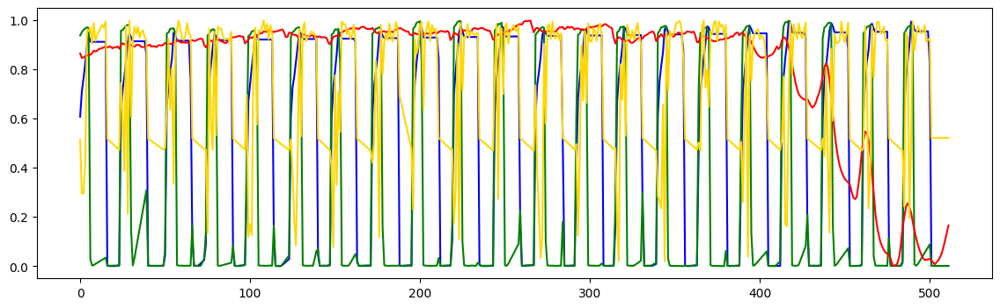

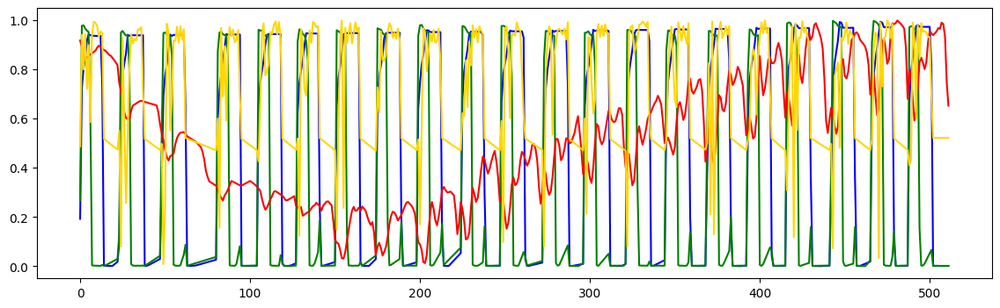

In [38]:
for i in range(35, 100):
    t = normal_df[i]
    
    plt.figure(figsize=(14,4))
    plt.plot(t[:,0], color = 'blue')
    plt.plot(t[:,1], color = 'green')
    plt.plot(t[:,2], color = 'red')
    plt.plot(t[:,3], color = 'gold')
    plt.show()

# Anomaly Detection

In [372]:
class LSTMAutoEncoder(nn.Module):
    def __init__(self, num_layers, hidden_size, nb_feature, dropout=0, device=torch.device('cpu')):
        super(LSTMAutoEncoder, self).__init__()
        self.device = device
        self.encoder = Encoder(num_layers, hidden_size, nb_feature, dropout, device)
        self.decoder = Decoder(num_layers, hidden_size, nb_feature, dropout, device)

    def forward(self, input_seq):
        output = torch.zeros(size=input_seq.shape, dtype=torch.float)
        hidden_cell = self.encoder(input_seq)
        input_decoder = input_seq[:, -1, :].view(input_seq.shape[0], 1, input_seq.shape[2])
        for i in range(input_seq.shape[1] - 1, -1, -1):
            output_decoder, hidden_cell = self.decoder(input_decoder, hidden_cell)
            input_decoder = output_decoder
            output[:, i, :] = output_decoder[:, 0, :]
        return output


class Encoder(nn.Module):
    def __init__(self, num_layers, hidden_size, nb_feature, dropout, device):
        super(Encoder, self).__init__()

        self.input_size = nb_feature
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.device = device

        self.lstm = nn.LSTM(input_size=nb_feature, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True, dropout=dropout, bias=True)

    def initHidden(self, batch_size):
        self.hidden_cell = (
            torch.randn((self.num_layers, batch_size, self.hidden_size), dtype=torch.float).to(self.device),
            torch.randn((self.num_layers, batch_size, self.hidden_size), dtype=torch.float).to(self.device)
        )

    def forward(self, input_seq):
        self.initHidden(input_seq.shape[0])
        _, self.hidden_cell = self.lstm(input_seq, self.hidden_cell)
        return self.hidden_cell


class Decoder(nn.Module):
    def __init__(self, num_layers, hidden_size, nb_feature, dropout, device):
        super(Decoder, self).__init__()

        self.input_size = nb_feature
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.device = device

        self.lstm = nn.LSTM(input_size=nb_feature, hidden_size=hidden_size,
                            num_layers=num_layers, batch_first=True, dropout=dropout, bias=True)
        self.linear = nn.Linear(in_features=hidden_size, out_features=nb_feature)

    def forward(self, input_seq, hidden_cell):
        output, hidden_cell = self.lstm(input_seq, hidden_cell)
        output = self.linear(output)
        return output, hidden_cell

In [373]:
def create_dataset(df):
    temp = df.tolist()
    dataset = [torch.tensor(s).float() for s in temp]
    
    n_seq, seq_len, n_features = torch.stack(dataset).shape
    
    return dataset, seq_len, n_features

In [374]:
class LossCheckpoint:
    def __init__(self):
        self.losses = []

    def plot(self, log=False):
        plt.figure(figsize=(10, 5))
        plt.plot(range(len(self.losses)), self.losses)
        plt.xlabel('epoch')
        plt.ylabel('loss')
        if log:
            plt.yscale('log')
        plt.show()
        
class EarlyStopping:
    def __init__(self, patience=0):
        self.last_metrics = 10**8
        self.patience = patience
        self.patience_count = 0

    def check_training(self, metric):
        if metric < self.last_metrics:
            self.last_metrics = metric
            self.patience_count = 0
            return False
        elif (metric > self.last_metrics) & (self.patience_count < self.patience):
            self.patience_count += 1
            return False
        else:
            return True

In [375]:
class ModelManagement:
    def __init__(self, path, name_model):
        self.path = path
        self.last_metrics = 10**8
        self.name_model = name_model
        self.dict_model = None

    def save(self, model):
        torch.save(model.state_dict(), self.path + '%s' % self.name_model)

    def checkpoint(self, epoch, model, optimizer, loss):
        if self.last_metrics > loss:
            self.dict_model = {
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'loss': loss,
            }
            self.last_metrics = loss

    def save_best_model(self):
        torch.save(self.dict_model, self.path + '%s_epoch_%d' % (self.name_model, self.dict_model['epoch']))

In [376]:
hidden_size = 32
num_layers = 4
batch_size = 128

model_path = '../model/'
name_model = f'lstm_{hidden_size}_{num_layers}_(len256)'
model_management = ModelManagement(model_path, name_model)

In [377]:
train_df, val_df = train_test_split(
  normal_df,
  test_size=0.1,
  random_state=1209
)

train_dataset, seq_len, n_features = create_dataset(train_df)
val_dataset, _, _ = create_dataset(val_df)
test_dataset, _, _ = create_dataset(abnormal_df)

In [378]:
model = LSTMAutoEncoder(num_layers, hidden_size, n_features, device=device)
model = model.to(device)

In [379]:
# optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)
# loss
criterion = torch.nn.MSELoss()
# Callbacks
earlyStopping = EarlyStopping(patience=10)
# Plot
loss_checkpoint_train = LossCheckpoint()
loss_checkpoint_valid = LossCheckpoint()

In [380]:
def train(epoch, train_loader):
    model.train()
    train_loss = 0
    for id_batch, data in enumerate(train_loader):
        optimizer.zero_grad()
        # forward
        data = data.to(device)
        output = model.forward(data)
        loss = criterion(data, output.to(device))
        # backward
        loss.backward()
        train_loss += loss.item()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.3)
        optimizer.step()

        print('\r', 'Training [{}/{} ({:.0f}%)] \tLoss: {:.6f})]'.format(
            id_batch + 1, len(train_loader),
            (id_batch + 1) * 100 / len(train_loader),
            loss.item()), sep='', end='', flush=True)

    avg_loss = train_loss / len(train_loader)
    print('====> Epoch: {} Average loss: {:.6f}'.format(epoch, avg_loss))
    loss_checkpoint_train.losses.append(avg_loss)

In [381]:
def evaluate(loader, validation=False, epoch=0):
    model.eval()
    eval_loss = 0
    with torch.no_grad():
        for id_batch, data in enumerate(loader):
            data = data.to(device)
            output = model.forward(data)
            loss = criterion(data, output.to(device))
            eval_loss += loss.item()
        print('\r', 'Eval [{}/{} ({:.0f}%)] \tLoss: {:.6f})]'.format(
            id_batch + 1, len(loader),
            (id_batch + 1) * 100 / len(loader),
            loss.item()), sep='', end='', flush=True)
    avg_loss = eval_loss / len(loader)
    print('====> Validation Average loss: {:.6f}'.format(avg_loss))
    # Checkpoint
    if validation:
        loss_checkpoint_valid.losses.append(avg_loss)
        model_management.checkpoint(epoch, model, optimizer, avg_loss)
        return earlyStopping.check_training(avg_loss)

In [382]:
train_loader = DataLoader(train_dataset, batch_size, shuffle=True)
valid_loader = DataLoader(val_dataset, batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size, shuffle=True)

In [383]:
epochs = 500

for epoch in range(1, epochs+1):
    train(epoch, train_loader)
    evaluate(valid_loader, validation=True, epoch=epoch)
    '''
    if earlyStopping.patience_count == 20:
        print('lr on plateau ', optimizer.param_groups[0]['lr'], ' -> ', optimizer.param_groups[0]['lr'] /10)
        optimizer.param_groups[0]['lr'] = optimizer.param_groups[0]['lr'] /10
    '''

Training [52/52 (100%)] 	Loss: 0.125740)]====> Epoch: 1 Average loss: 0.253424
Eval [6/6 (100%)] 	Loss: 0.126494)]====> Validation Average loss: 0.127280
Training [52/52 (100%)] 	Loss: 0.125010)]====> Epoch: 2 Average loss: 0.126392
Eval [6/6 (100%)] 	Loss: 0.124905)]====> Validation Average loss: 0.126176
Training [52/52 (100%)] 	Loss: 0.127039)]====> Epoch: 3 Average loss: 0.125866
Eval [6/6 (100%)] 	Loss: 0.126545)]====> Validation Average loss: 0.126171
Training [52/52 (100%)] 	Loss: 0.125123)]====> Epoch: 4 Average loss: 0.125475
Eval [6/6 (100%)] 	Loss: 0.126054)]====> Validation Average loss: 0.125414
Training [52/52 (100%)] 	Loss: 0.125642)]====> Epoch: 5 Average loss: 0.124918
Eval [6/6 (100%)] 	Loss: 0.124729)]====> Validation Average loss: 0.122904
Training [52/52 (100%)] 	Loss: 0.125631)]====> Epoch: 6 Average loss: 0.119584
Eval [6/6 (100%)] 	Loss: 0.127724)]====> Validation Average loss: 0.124576
Training [52/52 (100%)] 	Loss: 0.117201)]====> Epoch: 7 Average loss: 0.1208

Training [52/52 (100%)] 	Loss: 0.090496)]====> Epoch: 54 Average loss: 0.091303
Eval [6/6 (100%)] 	Loss: 0.088424)]====> Validation Average loss: 0.090873
Training [52/52 (100%)] 	Loss: 0.089835)]====> Epoch: 55 Average loss: 0.091674
Eval [6/6 (100%)] 	Loss: 0.091655)]====> Validation Average loss: 0.090997
Training [52/52 (100%)] 	Loss: 0.091198)]====> Epoch: 56 Average loss: 0.091219
Eval [6/6 (100%)] 	Loss: 0.089981)]====> Validation Average loss: 0.090367
Training [52/52 (100%)] 	Loss: 0.091408)]====> Epoch: 57 Average loss: 0.091347
Eval [6/6 (100%)] 	Loss: 0.094951)]====> Validation Average loss: 0.091993
Training [52/52 (100%)] 	Loss: 0.089041)]====> Epoch: 58 Average loss: 0.091737
Eval [6/6 (100%)] 	Loss: 0.090692)]====> Validation Average loss: 0.090876
Training [52/52 (100%)] 	Loss: 0.093268)]====> Epoch: 59 Average loss: 0.091442
Eval [6/6 (100%)] 	Loss: 0.090107)]====> Validation Average loss: 0.090624
Training [52/52 (100%)] 	Loss: 0.090670)]====> Epoch: 60 Average loss:

Training [52/52 (100%)] 	Loss: 0.092468)]====> Epoch: 107 Average loss: 0.089775
Eval [6/6 (100%)] 	Loss: 0.092938)]====> Validation Average loss: 0.091531
Training [52/52 (100%)] 	Loss: 0.089659)]====> Epoch: 108 Average loss: 0.089346
Eval [6/6 (100%)] 	Loss: 0.086973)]====> Validation Average loss: 0.089153
Training [52/52 (100%)] 	Loss: 0.090697)]====> Epoch: 109 Average loss: 0.089693
Eval [6/6 (100%)] 	Loss: 0.086604)]====> Validation Average loss: 0.088413
Training [52/52 (100%)] 	Loss: 0.089212)]====> Epoch: 110 Average loss: 0.090226
Eval [6/6 (100%)] 	Loss: 0.089763)]====> Validation Average loss: 0.088757
Training [52/52 (100%)] 	Loss: 0.090074)]====> Epoch: 111 Average loss: 0.089116
Eval [6/6 (100%)] 	Loss: 0.085307)]====> Validation Average loss: 0.088524
Training [52/52 (100%)] 	Loss: 0.089038)]====> Epoch: 112 Average loss: 0.089263
Eval [6/6 (100%)] 	Loss: 0.091669)]====> Validation Average loss: 0.091316
Training [52/52 (100%)] 	Loss: 0.089470)]====> Epoch: 113 Averag

Eval [6/6 (100%)] 	Loss: 0.081569)]====> Validation Average loss: 0.079630
Training [52/52 (100%)] 	Loss: 0.080012)]====> Epoch: 160 Average loss: 0.079564
Eval [6/6 (100%)] 	Loss: 0.082951)]====> Validation Average loss: 0.079558
Training [52/52 (100%)] 	Loss: 0.080292)]====> Epoch: 161 Average loss: 0.079043
Eval [6/6 (100%)] 	Loss: 0.077979)]====> Validation Average loss: 0.078227
Training [52/52 (100%)] 	Loss: 0.081810)]====> Epoch: 162 Average loss: 0.078913
Eval [6/6 (100%)] 	Loss: 0.083467)]====> Validation Average loss: 0.080620
Training [52/52 (100%)] 	Loss: 0.073605)]====> Epoch: 163 Average loss: 0.077514
Eval [6/6 (100%)] 	Loss: 0.077874)]====> Validation Average loss: 0.077431
Training [52/52 (100%)] 	Loss: 0.076045)]====> Epoch: 164 Average loss: 0.077643
Eval [6/6 (100%)] 	Loss: 0.077255)]====> Validation Average loss: 0.075666
Training [52/52 (100%)] 	Loss: 0.077136)]====> Epoch: 165 Average loss: 0.076398
Eval [6/6 (100%)] 	Loss: 0.072673)]====> Validation Average loss

Eval [6/6 (100%)] 	Loss: 0.044923)]====> Validation Average loss: 0.045397
Training [52/52 (100%)] 	Loss: 0.042722)]====> Epoch: 265 Average loss: 0.045326
Eval [6/6 (100%)] 	Loss: 0.050839)]====> Validation Average loss: 0.047357
Training [52/52 (100%)] 	Loss: 0.045919)]====> Epoch: 266 Average loss: 0.045773
Eval [6/6 (100%)] 	Loss: 0.053188)]====> Validation Average loss: 0.052354
Training [52/52 (100%)] 	Loss: 0.042324)]====> Epoch: 267 Average loss: 0.045448
Eval [6/6 (100%)] 	Loss: 0.047257)]====> Validation Average loss: 0.046514
Training [52/52 (100%)] 	Loss: 0.045605)]====> Epoch: 268 Average loss: 0.045350
Eval [6/6 (100%)] 	Loss: 0.050842)]====> Validation Average loss: 0.050737
Training [52/52 (100%)] 	Loss: 0.044394)]====> Epoch: 269 Average loss: 0.045225
Eval [6/6 (100%)] 	Loss: 0.043006)]====> Validation Average loss: 0.043236
Training [52/52 (100%)] 	Loss: 0.045782)]====> Epoch: 270 Average loss: 0.046936
Eval [6/6 (100%)] 	Loss: 0.047153)]====> Validation Average loss

Eval [6/6 (100%)] 	Loss: 0.039108)]====> Validation Average loss: 0.038135
Training [52/52 (100%)] 	Loss: 0.037459)]====> Epoch: 370 Average loss: 0.036062
Eval [6/6 (100%)] 	Loss: 0.039788)]====> Validation Average loss: 0.036760
Training [52/52 (100%)] 	Loss: 0.035076)]====> Epoch: 371 Average loss: 0.036767
Eval [6/6 (100%)] 	Loss: 0.037260)]====> Validation Average loss: 0.037570
Training [52/52 (100%)] 	Loss: 0.031585)]====> Epoch: 372 Average loss: 0.034171
Eval [6/6 (100%)] 	Loss: 0.031993)]====> Validation Average loss: 0.032776
Training [52/52 (100%)] 	Loss: 0.041269)]====> Epoch: 373 Average loss: 0.034542
Eval [6/6 (100%)] 	Loss: 0.045148)]====> Validation Average loss: 0.044481
Training [52/52 (100%)] 	Loss: 0.034470)]====> Epoch: 374 Average loss: 0.036937
Eval [6/6 (100%)] 	Loss: 0.041370)]====> Validation Average loss: 0.039546
Training [52/52 (100%)] 	Loss: 0.034655)]====> Epoch: 375 Average loss: 0.038061
Eval [6/6 (100%)] 	Loss: 0.039420)]====> Validation Average loss

Eval [6/6 (100%)] 	Loss: 0.031744)]====> Validation Average loss: 0.032681
Training [52/52 (100%)] 	Loss: 0.029746)]====> Epoch: 475 Average loss: 0.030510
Eval [6/6 (100%)] 	Loss: 0.028977)]====> Validation Average loss: 0.029883
Training [52/52 (100%)] 	Loss: 0.035373)]====> Epoch: 476 Average loss: 0.030146
Eval [6/6 (100%)] 	Loss: 0.029381)]====> Validation Average loss: 0.030674
Training [52/52 (100%)] 	Loss: 0.028589)]====> Epoch: 477 Average loss: 0.030645
Eval [6/6 (100%)] 	Loss: 0.032423)]====> Validation Average loss: 0.032414
Training [52/52 (100%)] 	Loss: 0.031335)]====> Epoch: 478 Average loss: 0.030179
Eval [6/6 (100%)] 	Loss: 0.030662)]====> Validation Average loss: 0.029125
Training [52/52 (100%)] 	Loss: 0.028331)]====> Epoch: 479 Average loss: 0.030359
Eval [6/6 (100%)] 	Loss: 0.028980)]====> Validation Average loss: 0.030094
Training [52/52 (100%)] 	Loss: 0.026764)]====> Epoch: 480 Average loss: 0.030057
Eval [6/6 (100%)] 	Loss: 0.032623)]====> Validation Average loss

In [384]:
model_management.save_best_model()

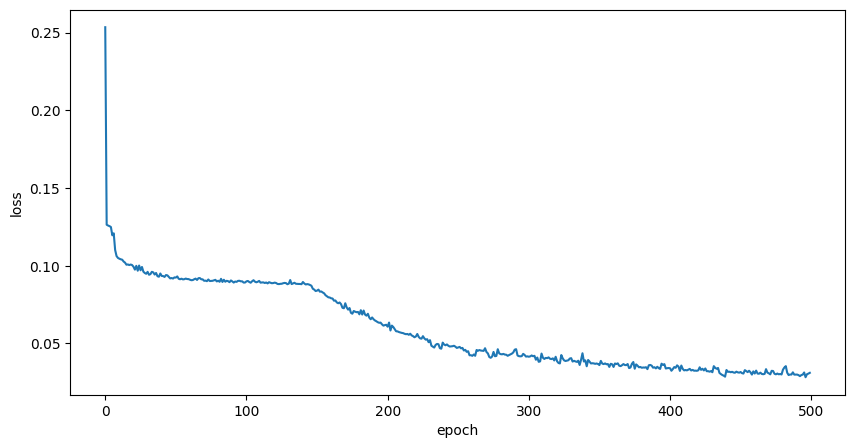

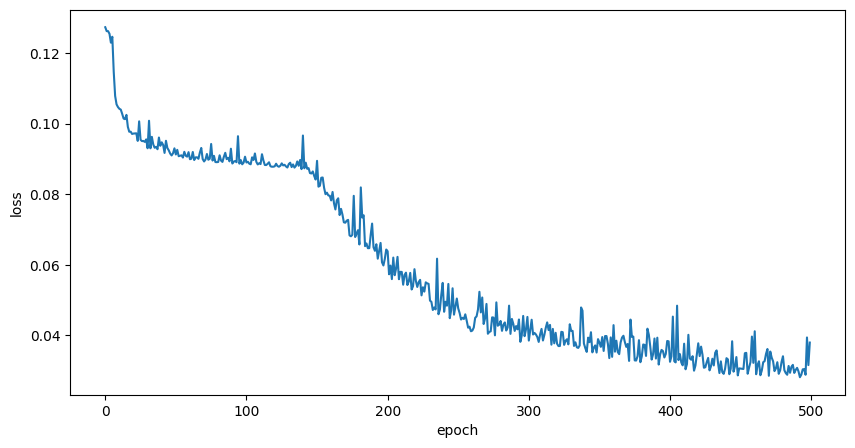

In [385]:
loss_checkpoint_train.plot()
loss_checkpoint_valid.plot()

# Prediction

In [386]:
hidden_size = 32
num_layers = 4
model_best = LSTMAutoEncoder(num_layers, hidden_size, n_features, device=device)
checkpoint = torch.load('../model/lstm_32_4_(len256)_epoch_493')
model_best.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [387]:
'''
def detect_anomalies(model, data_loader, threshold):
    model.eval()
    anomalies = []
    with torch.no_grad():
        for data in data_loader:
            data = data.to(device)
            output = model.forward(data)
            loss = criterion(data, output.to(device))
            if loss.item() > threshold:
                anomalies.append(data)
    return anomalies
'''

'\ndef detect_anomalies(model, data_loader, threshold):\n    model.eval()\n    anomalies = []\n    with torch.no_grad():\n        for data in data_loader:\n            data = data.to(device)\n            output = model.forward(data)\n            loss = criterion(data, output.to(device))\n            if loss.item() > threshold:\n                anomalies.append(data)\n    return anomalies\n'

In [388]:
print(len(val_dataset), len(test_dataset))

737 50


In [389]:
model_best.to(device)

LSTMAutoEncoder(
  (encoder): Encoder(
    (lstm): LSTM(4, 32, num_layers=4, batch_first=True)
  )
  (decoder): Decoder(
    (lstm): LSTM(4, 32, num_layers=4, batch_first=True)
    (linear): Linear(in_features=32, out_features=4, bias=True)
  )
)

In [390]:
model_best.eval()

LSTMAutoEncoder(
  (encoder): Encoder(
    (lstm): LSTM(4, 32, num_layers=4, batch_first=True)
  )
  (decoder): Decoder(
    (lstm): LSTM(4, 32, num_layers=4, batch_first=True)
    (linear): Linear(in_features=32, out_features=4, bias=True)
  )
)

In [391]:
val_anomalies=0
val_nomal = len(val_dataset)
val_loss = []

with torch.no_grad():
    for data in val_dataset:
        data = data.unsqueeze(0).to(device)
        output = model_best.forward(data).to(device)
        loss = criterion(data, output)
        val_loss.append(loss)
        #if loss > threshold:

In [392]:
test_loss = []

with torch.no_grad():
    for data in test_dataset:
        data = data.unsqueeze(0).to(device)
        output = model_best.forward(data).to(device)
        loss = criterion(data, output)
        test_loss.append(loss)
        #if loss > threshold:
            

In [401]:
threshold = 0.036
val_anomal = 0
test_anomal = 0

for loss in val_loss:
    if loss > threshold:
        val_anomal +=1
        
for loss in test_loss:
    if loss > threshold:
        test_anomal +=1
        
print(f'validataion anomal = {val_anomal}')
print(f'test anomal = {test_anomal}')

validataion anomal = 336
test anomal = 40


In [394]:
TP = test_anomal
FP = val_anomal

TN = len(val_dataset)-val_anomal
FN = len(test_dataset)-test_anomal


In [395]:
Accuracy = (TP+TN) / (TP+FP+TN+FN)

precision = TP / (TP+FP)
recall = TP / (TP+FN)
F1 = 2 / (1/precision + 1/recall)

In [396]:
print(f'Accuracy // Precision // Recall // F1-Score')
print(f'{Accuracy} // {precision} // {recall} // {F1}')

Accuracy // Precision // Recall // F1-Score
0.9174078780177891 // 0.40963855421686746 // 0.68 // 0.5112781954887218
